In [3]:
%load_ext autoreload
%autoreload 2

import os
import numpy as np
import matplotlib.pyplot as plt
import m2py.segmentation.segmentation_gmm as seg_gmm
import m2py.segmentation.segmentation_watershed as seg_water
from m2py.utils import pre_processing as pre
from m2py.utils import post_processing as post
from m2py.utils import seg_label_utils as slu
from m2py.utils import config

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [4]:
data_dir = os.path.join(os.getcwd(), "../data")

# First Example

In [5]:
# Loads Sample 1
data_file = os.path.join(data_dir, "sample1.npy")
data_type = "QNM"
data_subtype = "2ComponentFilms"

data = np.load(data_file)

data_properties = config.data_info[data_type]['properties']
print(f"Shape of input data is: {data.shape}")
print(f"Properties are: {data_properties}")

Shape of input data is: (512, 512, 6)
Properties are: ['Adhesion', 'Deformation', 'Dissipation', 'LogDMT', 'Height', 'Stiffness']


## A-Priori Statistical Analysis

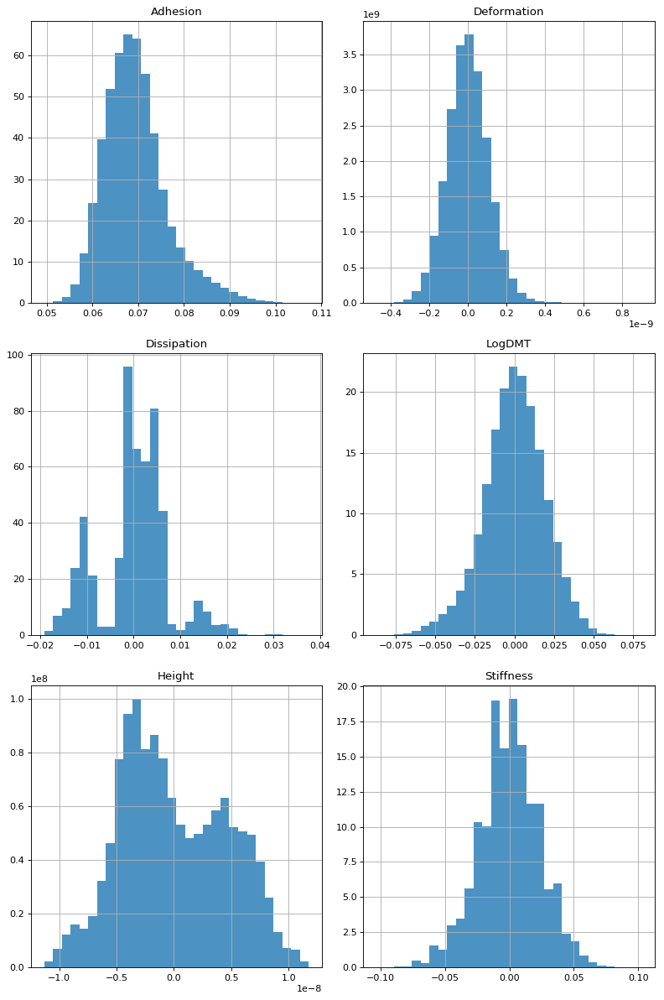

In [6]:
# Show property distributions

pre.show_property_distributions(data, data_type)


## Outlier Extraction

/Users/diegotorrejon/Projects/Other/m2py/VENV/lib/python3.6/site-packages/scipy/fftpack/basic.py:160: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  z[index] = x


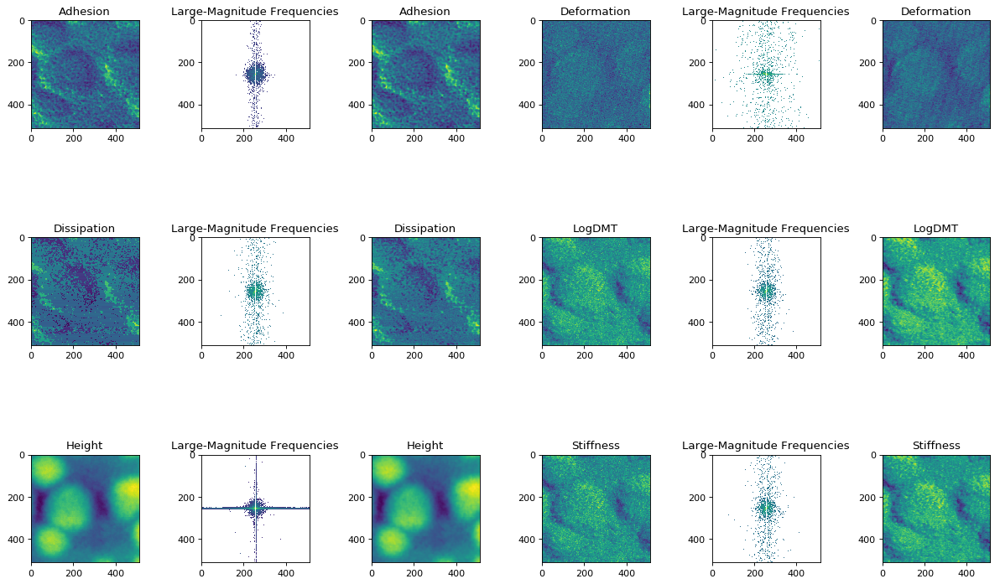

In [7]:
# Apply band-pass filter to data
filtered_data = pre.apply_frequency_removal(data, data_type)


## Semantic Segmentation

In [13]:
# Apply semantic segmentation

c = data.shape[2]
num_pca_components = min(4, c)

seg = seg_gmm.SegmenterGMM(n_components=2, embedding_dim=num_pca_components,
                           nonlinear=True, normalize=True,
                          padding=0, zscale=False)

pre_labels = seg.fit_transform(data)

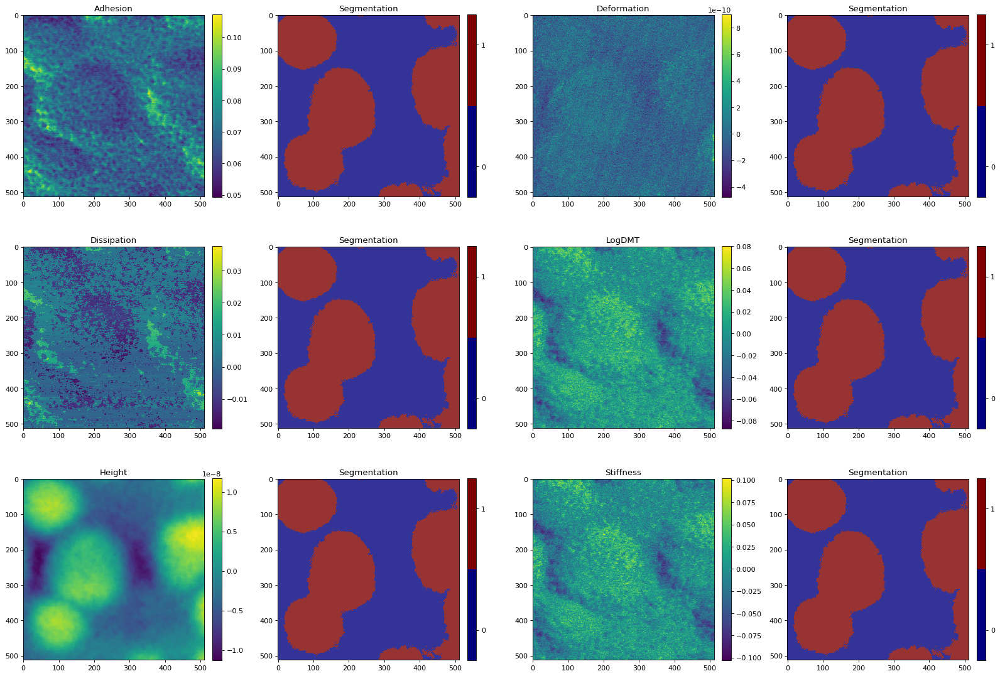

In [14]:
# Plot semantic segmentation

post.show_classification(pre_labels, data, data_type)

## Semantic Segmentation: A-Posteriori Statistical Analysis

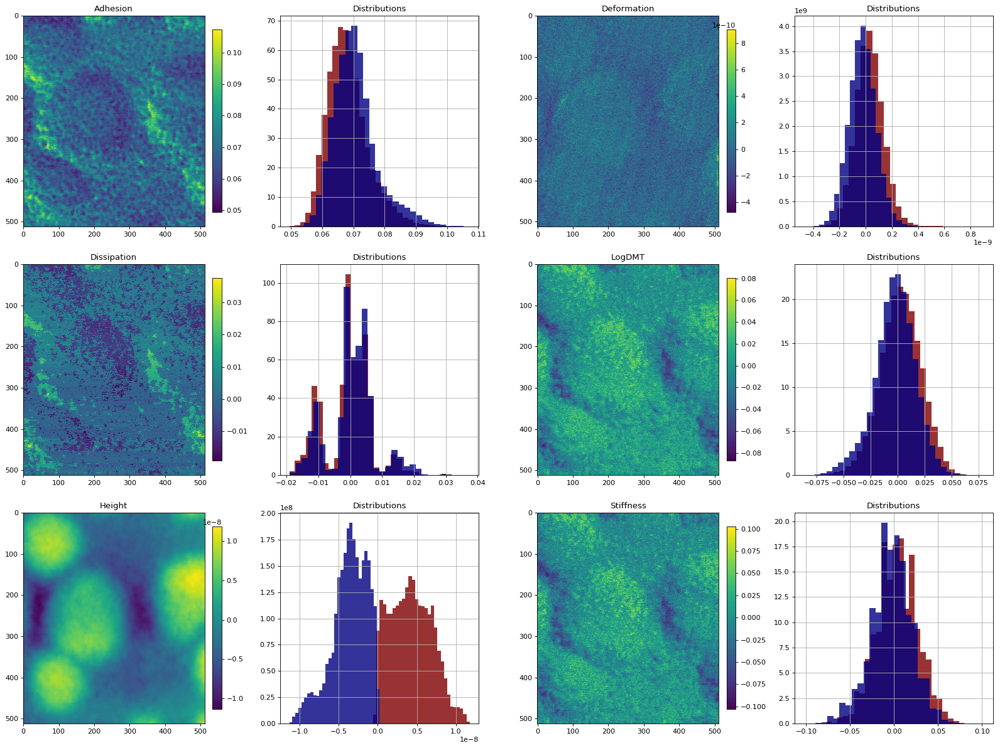

In [15]:
# Distributions of properties after semantic segmentation

post.show_classification_distributions(pre_labels, data, None, data_type)

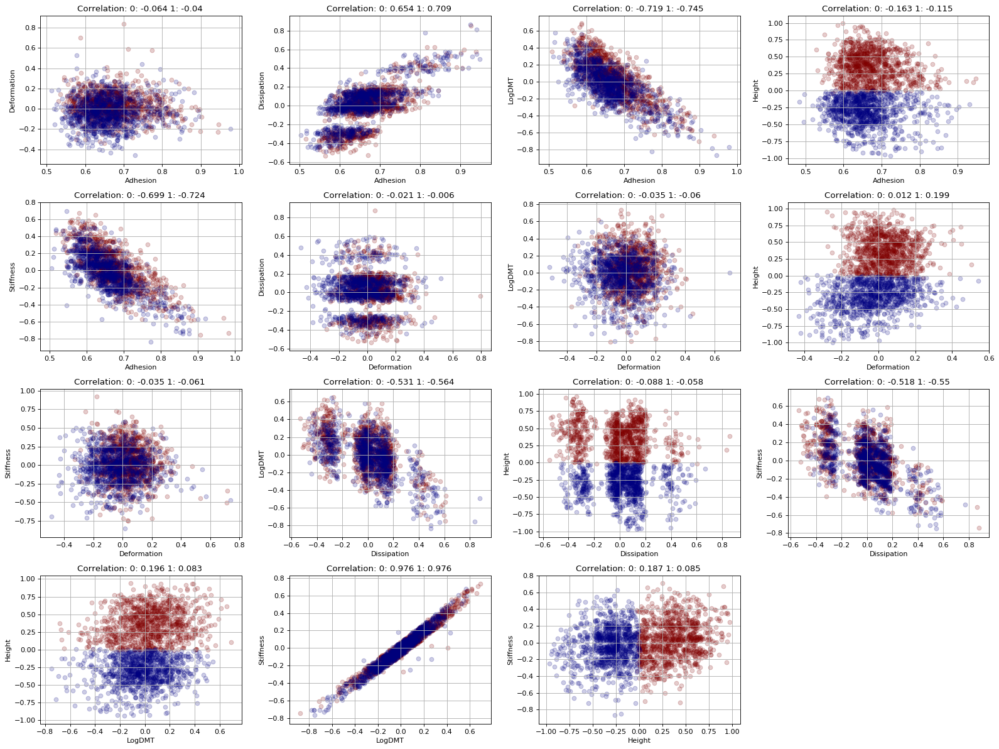

In [16]:
# Scatter plot and correlation of properties after semantic segmentation

post.show_classification_correlation(pre_labels, data, data_type) 

## Instance Segmentation: Connected Components (Example of Undersegmentation)

In [20]:
# Apply instance segmentation (connected components)

post_labels = seg.get_grains(pre_labels)
grain_labels = slu.get_significant_labels(post_labels, bg_contrast_flag=True, label_thresh=50)

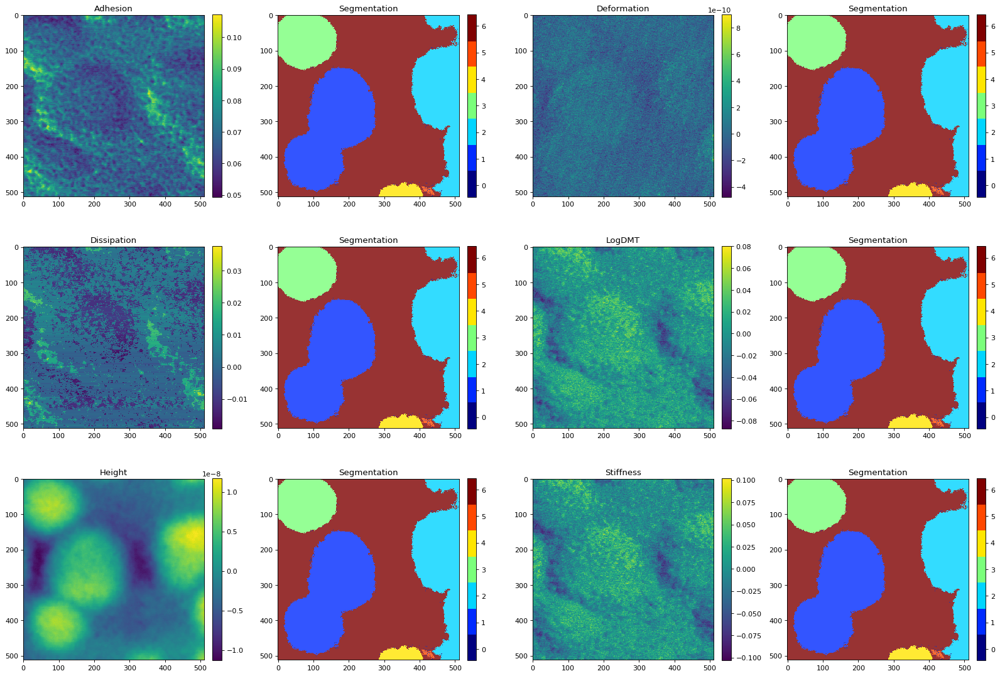

In [21]:
# Plot instance segmentation

post.show_classification(grain_labels, data, data_type, input_cmap="jet")    

## Instance Segmentation: Persistence Watershed

In [27]:
# Apply instance segmentation (persistence watershed)

seg_w = seg_water.SegmenterWatershed()
height_id = data_properties.index("Height")

thresh = 0.3  
height_data = data[:, :, height_id]
labels = seg_w.fit_transform(height_data, pers_thresh=thresh)    

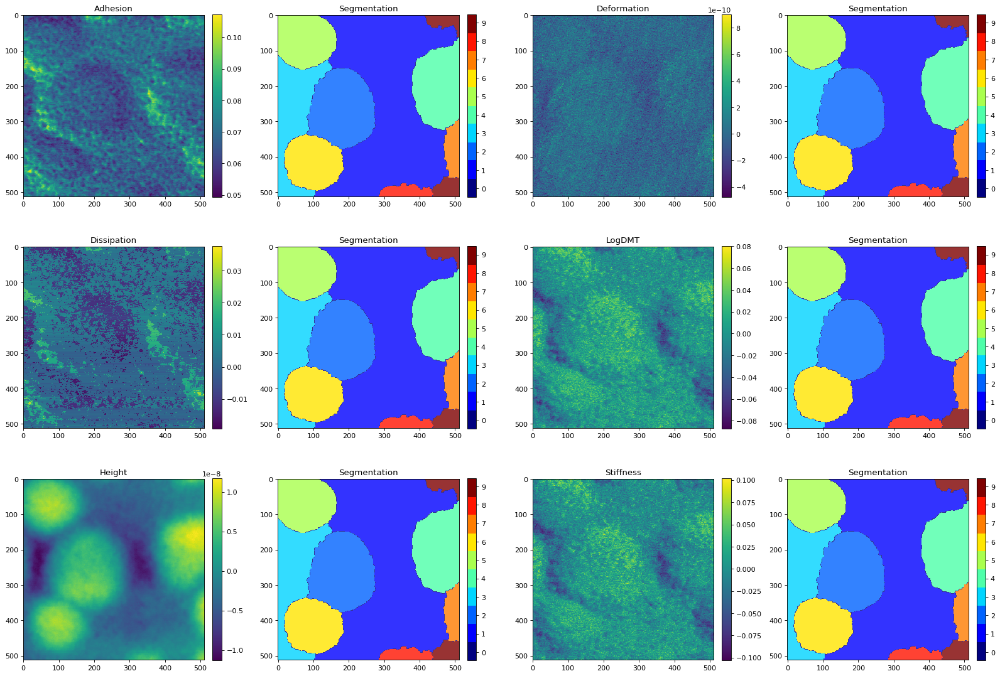

In [28]:
# Plot instance segmentation

post.show_classification(labels, data, data_type)

# Second Example

In [29]:
# Loads Sample 2
data_file = os.path.join(data_dir, "sample2.npy")
data_type = "QNM"
data_subtype = "Nanowires"

data = np.load(data_file)

data_properties = config.data_info[data_type]['properties']
print(f"Shape of input data is: {data.shape}")
print(f"Properties are: {data_properties}")

Shape of input data is: (512, 512, 6)
Properties are: ['Adhesion', 'Deformation', 'Dissipation', 'LogDMT', 'Height', 'Stiffness']


## A-Priori Statistical Analysis

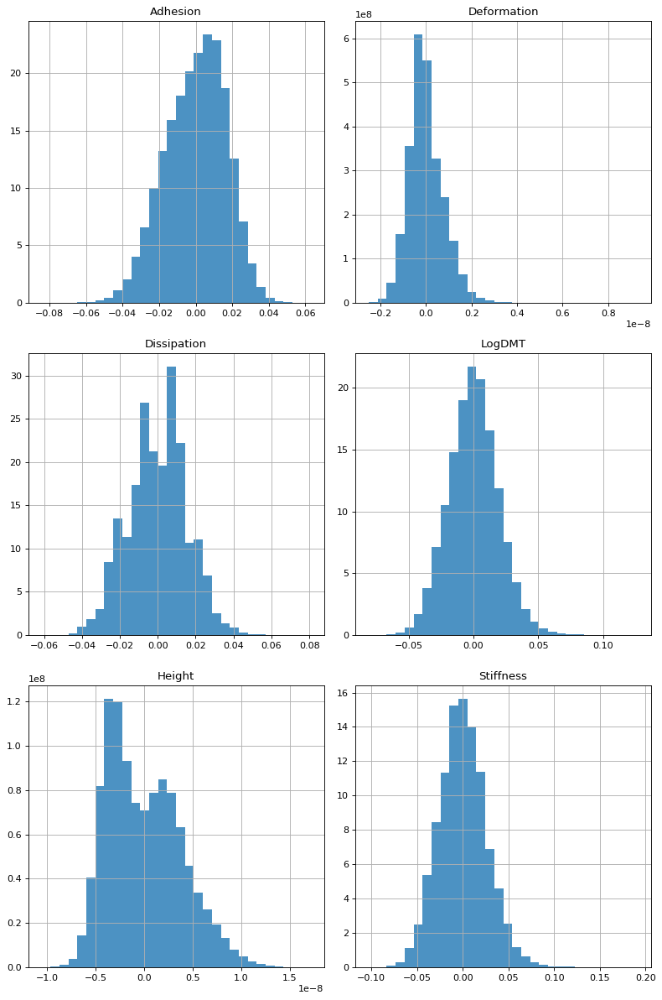

In [30]:
# Show property distributions

pre.show_property_distributions(data, data_type)

## Outlier Extraction

/Users/diegotorrejon/Projects/Other/m2py/VENV/lib/python3.6/site-packages/scipy/fftpack/basic.py:160: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  z[index] = x


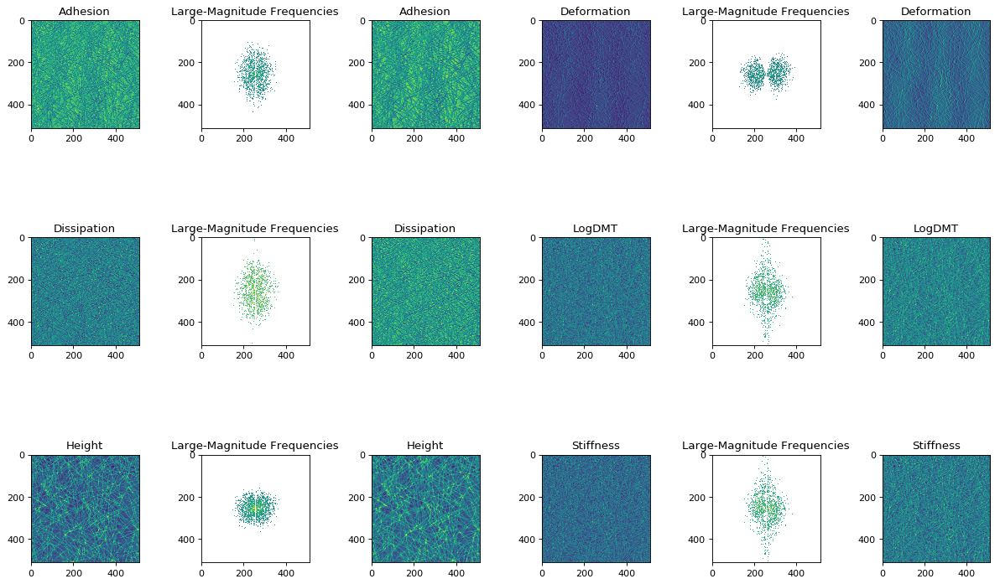

In [31]:
# Apply band-pass filter to data
filtered_data = pre.apply_frequency_removal(data, data_type)


There were 4 chips generated.


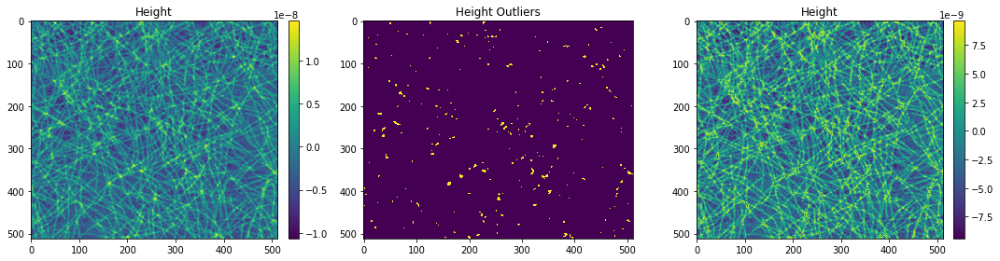

In [32]:
# Get outliers from height property

outliers = pre.extract_outliers(filtered_data, data_type, "Height", 2.5, 256, 256)
pre.show_outliers(filtered_data, data_type, "Height", outliers)
no_outliers_data = pre.smooth_outliers_from_data(filtered_data, outliers)


## Semantic Segmentation

In [45]:
# Apply semantic segmentation

c = data.shape[2]
num_pca_components = min(4, c)

seg = seg_gmm.SegmenterGMM(n_components=3, embedding_dim=num_pca_components,
                           nonlinear=False, normalize=True,
                          padding=0, zscale=False)

pre_labels = seg.fit_transform(no_outliers_data, outliers)

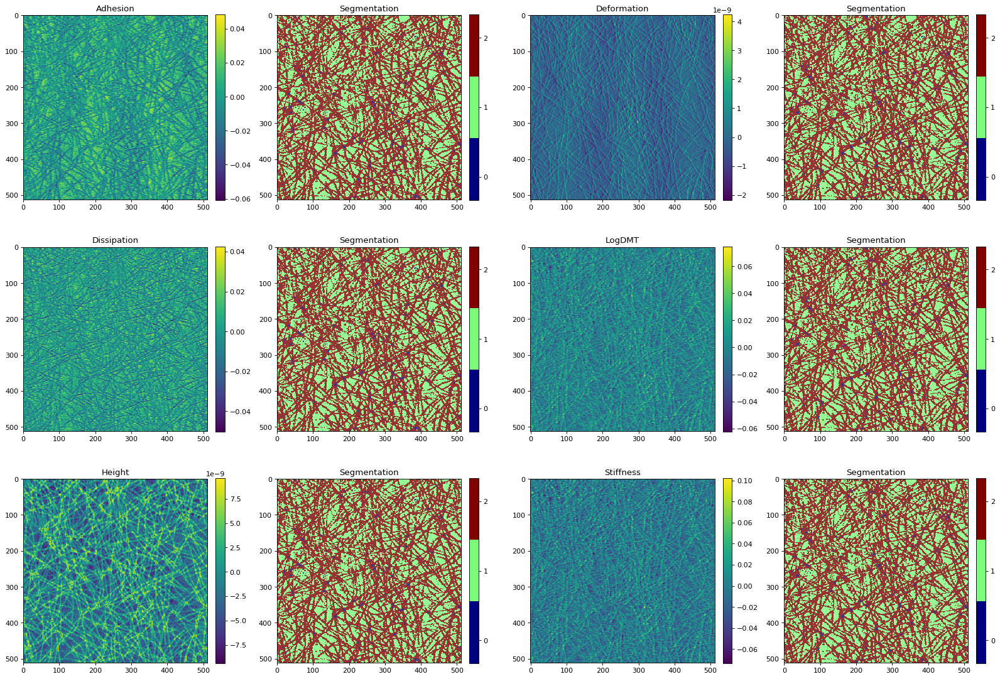

In [61]:
# Plot semantic segmentation

post.show_classification(pre_labels, no_outliers_data, data_type, input_cmap="jet")

## Semantic Segmentation: A-Posteriori Statistical Analysis

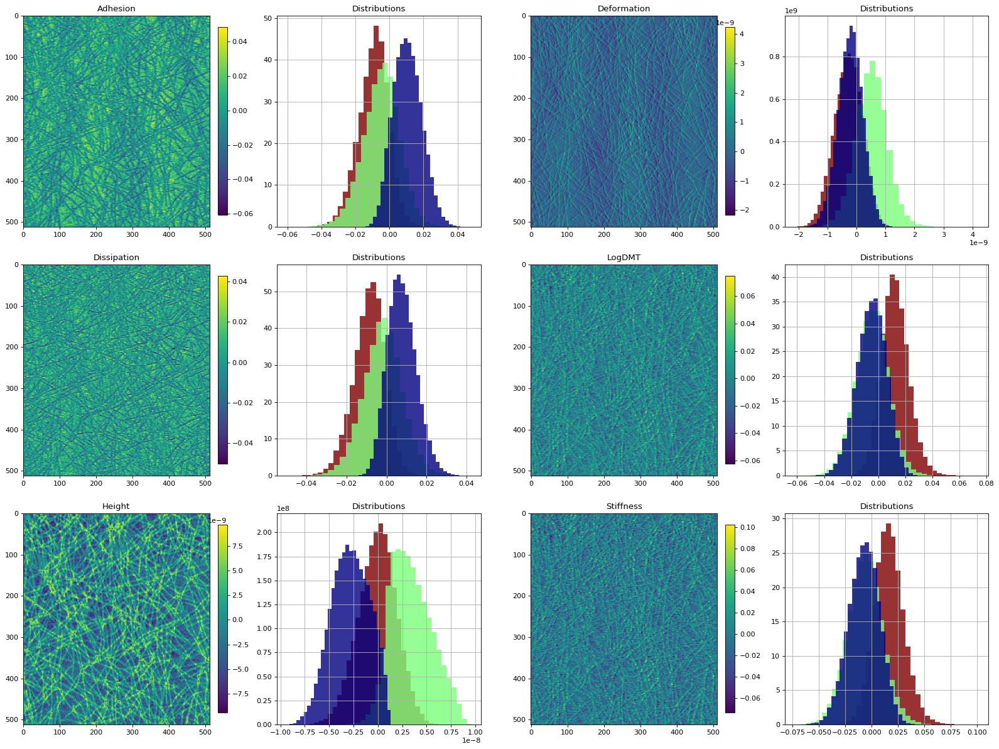

In [62]:
# Distributions of properties after semantic segmentation

post.show_classification_distributions(pre_labels, no_outliers_data, outliers, data_type)

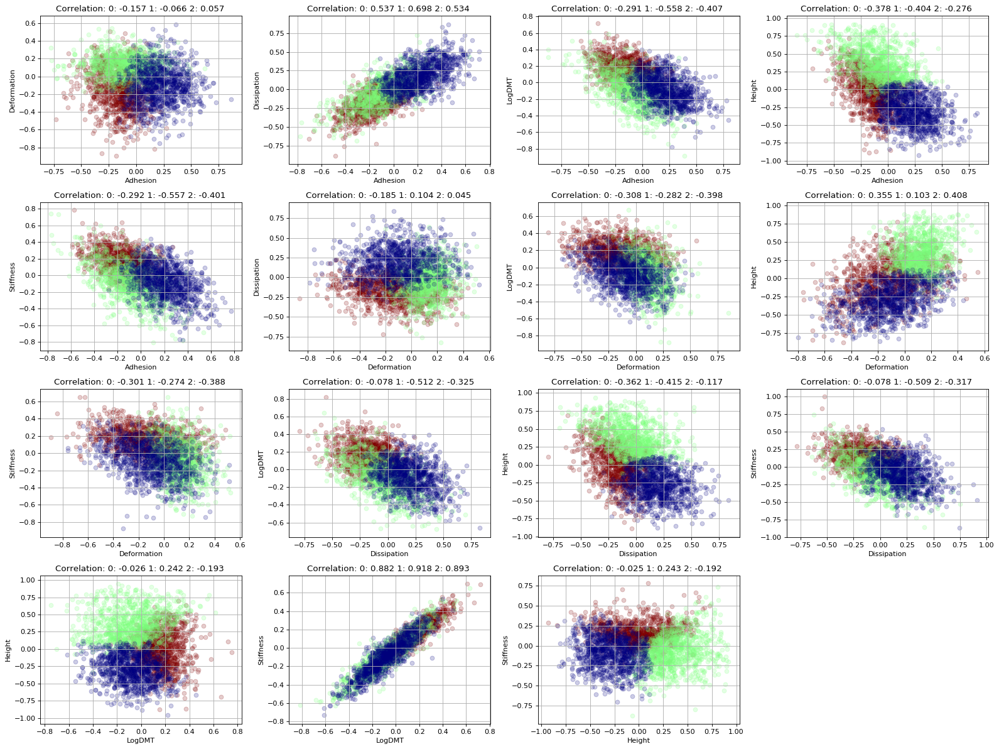

In [53]:
# Scatter plot and correlation of properties after semantic segmentation

post.show_classification_correlation(pre_labels, no_outliers_data, data_type)    

## Instance Segmentation: Connected Components

In [54]:
# Apply instance segmentation (connected components)

post_labels = seg.get_grains(pre_labels)
grain_labels = slu.get_significant_labels(post_labels, bg_contrast_flag=True, label_thresh=500)

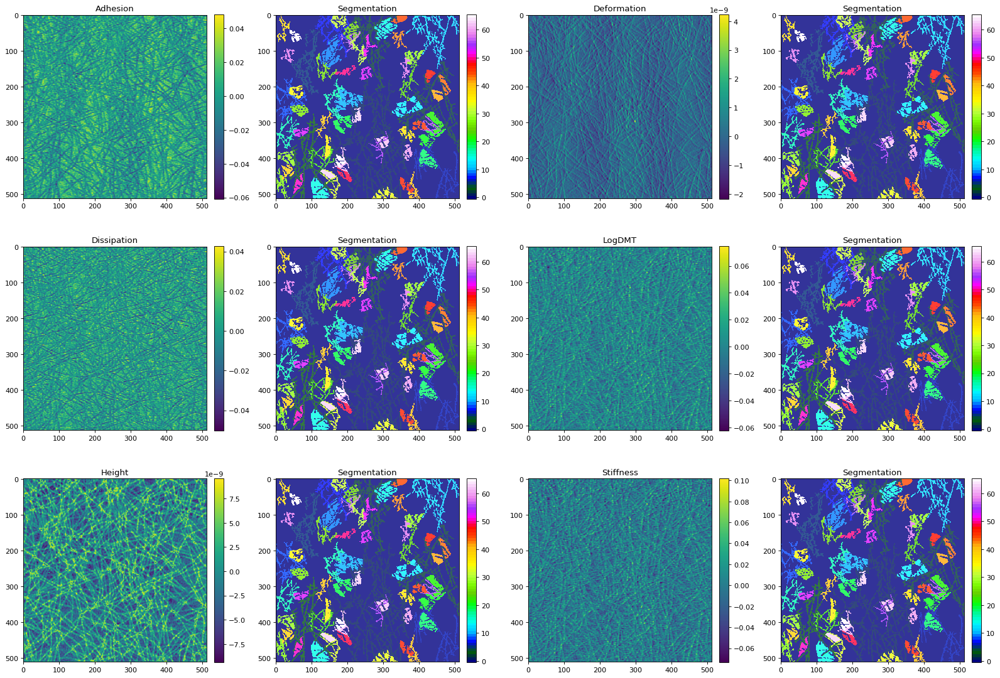

In [57]:
# Plot instance segmentation

post.show_classification(grain_labels, no_outliers_data, data_type, input_cmap="gist_ncar")

## Instance Segmentation: Persistence Watershed (Example of Oversegmentation)

In [67]:
# Apply instance segmentation (persistence watershed)

seg_w = seg_water.SegmenterWatershed()
height_id = data_properties.index("Height")

thresh = 0.4 # TODO: change to 0.01 for cAMF and AMFM and 0.4 otherwise. 0.3 for 2componentfilm
height_data = no_outliers_data[:, :, height_id]
labels = seg_w.fit_transform(height_data, outliers, pers_thresh=thresh)

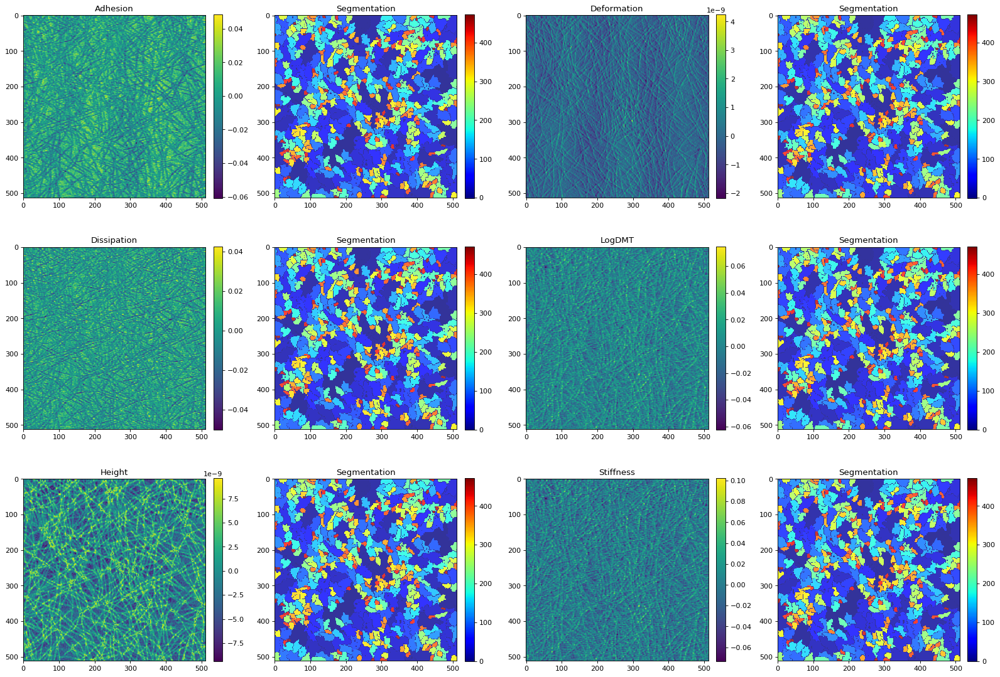

In [68]:
# Plot instance segmentation

post.show_classification(labels, no_outliers_data, data_type)